Hi Yati, I have taken this dataset as I found it to be somewhat relevant to the client we are working for.
Source for the dataset and problem statements : https://www.hackerearth.com/problem/machine-learning/predict-the-cost-to-ship-the-sculptures-12-e7728f5d/?purpose=signup&source=problem-page&update=google

I am first starting with my own personal trial and errors. Will later go on to take help with notebooks .


In [126]:
import pandas as pd
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings("ignore")

In [127]:
df = pd.read_csv("train.csv")


In [128]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6500 entries, 0 to 6499
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Customer Id            6500 non-null   object 
 1   Artist Name            6500 non-null   object 
 2   Artist Reputation      5750 non-null   float64
 3   Height                 6125 non-null   float64
 4   Width                  5916 non-null   float64
 5   Weight                 5913 non-null   float64
 6   Material               5736 non-null   object 
 7   Price Of Sculpture     6500 non-null   float64
 8   Base Shipping Price    6500 non-null   float64
 9   International          6500 non-null   object 
 10  Express Shipment       6500 non-null   object 
 11  Installation Included  6500 non-null   object 
 12  Transport              5108 non-null   object 
 13  Fragile                6500 non-null   object 
 14  Customer Information   6500 non-null   object 
 15  Remo

In [129]:
print(df.shape)
print("_"*20)
print("Sum of Null values")
df.isna().sum()

(6500, 20)
____________________
Sum of Null values


Customer Id                 0
Artist Name                 0
Artist Reputation         750
Height                    375
Width                     584
Weight                    587
Material                  764
Price Of Sculpture          0
Base Shipping Price         0
International               0
Express Shipment            0
Installation Included       0
Transport                1392
Fragile                     0
Customer Information        0
Remote Location           771
Scheduled Date              0
Delivery Date               0
Customer Location           0
Cost                        0
dtype: int64

In [130]:
df.head(4)

,Customer Id,Artist Name,Artist Reputation,Height,Width,Weight,Material,Price Of Sculpture,Base Shipping Price,International,Express Shipment,Installation Included,Transport,Fragile,Customer Information,Remote Location,Scheduled Date,Delivery Date,Customer Location,Cost
0,fffe3900350033003300,Billy Jenkins,0.26,17.0,6.0,4128.0,Brass,13.91,16.27,Yes,Yes,No,Airways,No,Working Class,No,06/07/15,06/03/15,"New Michelle, OH 50777",-283.29
1,fffe3800330031003900,Jean Bryant,0.28,3.0,3.0,61.0,Brass,6.83,15.00,No,No,No,Roadways,No,Working Class,No,03/06/17,03/05/17,"New Michaelport, WY 12072",-159.96
2,fffe3600370035003100,Laura Miller,0.07,8.0,5.0,237.0,Clay,4.96,21.18,No,No,No,Roadways,Yes,Working Class,Yes,03/09/15,03/08/15,"Bowmanshire, WA 19241",-154.29
3,fffe350031003300,Robert Chaires,0.12,9.0,NaN,NaN,Aluminium,5.81,16.31,No,No,No,NaN,No,Wealthy,Yes,05/24/15,05/20/15,"East Robyn, KY 86375",-161.16


In [131]:
df.describe()

,Artist Reputation,Height,Width,Weight,Price Of Sculpture,Base Shipping Price,Cost
count,5750.000000,6125.000000,5916.000000,5.913000e+03,6500.00000,6500.000000,6.500000e+03
mean,0.461850,21.766204,9.617647,4.006948e+05,1192.42009,37.407174,1.713920e+04
std,0.265781,11.968192,5.417000,2.678081e+06,8819.61675,26.873519,2.406579e+05
min,0.000000,3.000000,2.000000,3.000000e+00,3.00000,10.000000,-8.801727e+05
25%,0.240000,12.000000,6.000000,5.030000e+02,5.23000,16.700000,1.884400e+02
50%,0.450000,20.000000,8.000000,3.102000e+03,8.02500,23.505000,3.820650e+02
75%,0.680000,30.000000,12.000000,3.645600e+04,89.47000,57.905000,1.156115e+03
max,1.000000,73.000000,50.000000,1.179279e+08,382385.67000,99.980000,1.114343e+07


In [132]:
df.dtypes

Customer Id               object
Artist Name               object
Artist Reputation        float64
Height                   float64
Width                    float64
Weight                   float64
Material                  object
Price Of Sculpture       float64
Base Shipping Price      float64
International             object
Express Shipment          object
Installation Included     object
Transport                 object
Fragile                   object
Customer Information      object
Remote Location           object
Scheduled Date            object
Delivery Date             object
Customer Location         object
Cost                     float64
dtype: object

Observations :-
- There are 6 values which are of float type
- A lot of null values to deal with.
- Date column can be used to create new column for days and months of shipment.
- Probability disbn to be made for float columns. (Part of EDA)

In [133]:
df.head()

,Customer Id,Artist Name,Artist Reputation,Height,Width,Weight,Material,Price Of Sculpture,Base Shipping Price,International,Express Shipment,Installation Included,Transport,Fragile,Customer Information,Remote Location,Scheduled Date,Delivery Date,Customer Location,Cost
0,fffe3900350033003300,Billy Jenkins,0.26,17.0,6.0,4128.0,Brass,13.91,16.27,Yes,Yes,No,Airways,No,Working Class,No,06/07/15,06/03/15,"New Michelle, OH 50777",-283.29
1,fffe3800330031003900,Jean Bryant,0.28,3.0,3.0,61.0,Brass,6.83,15.00,No,No,No,Roadways,No,Working Class,No,03/06/17,03/05/17,"New Michaelport, WY 12072",-159.96
2,fffe3600370035003100,Laura Miller,0.07,8.0,5.0,237.0,Clay,4.96,21.18,No,No,No,Roadways,Yes,Working Class,Yes,03/09/15,03/08/15,"Bowmanshire, WA 19241",-154.29
3,fffe350031003300,Robert Chaires,0.12,9.0,NaN,NaN,Aluminium,5.81,16.31,No,No,No,NaN,No,Wealthy,Yes,05/24/15,05/20/15,"East Robyn, KY 86375",-161.16
4,fffe3900320038003400,Rosalyn Krol,0.15,17.0,6.0,324.0,Aluminium,3.18,11.94,Yes,Yes,Yes,Airways,No,Working Class,No,12/18/16,12/14/16,"Aprilside, PA 52793",-159.23


<AxesSubplot:xlabel='Artist Reputation', ylabel='Count'>

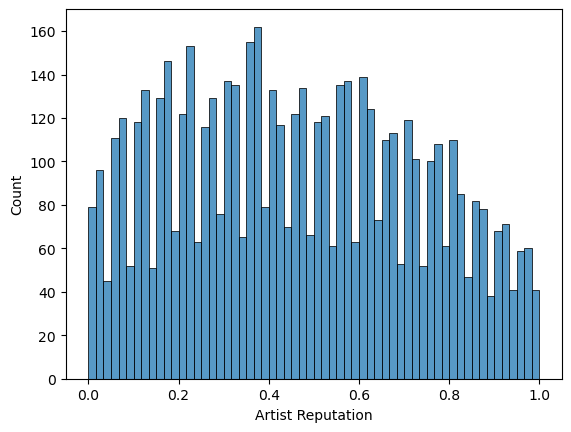

In [134]:
sns.histplot(df['Artist Reputation'] , bins = 60)

In [135]:
df.head()

,Customer Id,Artist Name,Artist Reputation,Height,Width,Weight,Material,Price Of Sculpture,Base Shipping Price,International,Express Shipment,Installation Included,Transport,Fragile,Customer Information,Remote Location,Scheduled Date,Delivery Date,Customer Location,Cost
0,fffe3900350033003300,Billy Jenkins,0.26,17.0,6.0,4128.0,Brass,13.91,16.27,Yes,Yes,No,Airways,No,Working Class,No,06/07/15,06/03/15,"New Michelle, OH 50777",-283.29
1,fffe3800330031003900,Jean Bryant,0.28,3.0,3.0,61.0,Brass,6.83,15.00,No,No,No,Roadways,No,Working Class,No,03/06/17,03/05/17,"New Michaelport, WY 12072",-159.96
2,fffe3600370035003100,Laura Miller,0.07,8.0,5.0,237.0,Clay,4.96,21.18,No,No,No,Roadways,Yes,Working Class,Yes,03/09/15,03/08/15,"Bowmanshire, WA 19241",-154.29
3,fffe350031003300,Robert Chaires,0.12,9.0,NaN,NaN,Aluminium,5.81,16.31,No,No,No,NaN,No,Wealthy,Yes,05/24/15,05/20/15,"East Robyn, KY 86375",-161.16
4,fffe3900320038003400,Rosalyn Krol,0.15,17.0,6.0,324.0,Aluminium,3.18,11.94,Yes,Yes,Yes,Airways,No,Working Class,No,12/18/16,12/14/16,"Aprilside, PA 52793",-159.23


In [136]:
import plotly.express as px

fig = px.histogram(df, x='Height', nbins=30, marginal='box')
fig.show()

In [137]:
fig = px.histogram(df , x='Artist Reputation', nbins=30, marginal='box')
fig.show()

In [138]:
fig = px.histogram(df , x='Price Of Sculpture', nbins=30)
fig.show()

Box plot would be a better way to do this

In [139]:
fig = px.box(df, x='Price Of Sculpture', notched=True)
fig.show()

In [140]:
df.head()

,Customer Id,Artist Name,Artist Reputation,Height,Width,Weight,Material,Price Of Sculpture,Base Shipping Price,International,Express Shipment,Installation Included,Transport,Fragile,Customer Information,Remote Location,Scheduled Date,Delivery Date,Customer Location,Cost
0,fffe3900350033003300,Billy Jenkins,0.26,17.0,6.0,4128.0,Brass,13.91,16.27,Yes,Yes,No,Airways,No,Working Class,No,06/07/15,06/03/15,"New Michelle, OH 50777",-283.29
1,fffe3800330031003900,Jean Bryant,0.28,3.0,3.0,61.0,Brass,6.83,15.00,No,No,No,Roadways,No,Working Class,No,03/06/17,03/05/17,"New Michaelport, WY 12072",-159.96
2,fffe3600370035003100,Laura Miller,0.07,8.0,5.0,237.0,Clay,4.96,21.18,No,No,No,Roadways,Yes,Working Class,Yes,03/09/15,03/08/15,"Bowmanshire, WA 19241",-154.29
3,fffe350031003300,Robert Chaires,0.12,9.0,NaN,NaN,Aluminium,5.81,16.31,No,No,No,NaN,No,Wealthy,Yes,05/24/15,05/20/15,"East Robyn, KY 86375",-161.16
4,fffe3900320038003400,Rosalyn Krol,0.15,17.0,6.0,324.0,Aluminium,3.18,11.94,Yes,Yes,Yes,Airways,No,Working Class,No,12/18/16,12/14/16,"Aprilside, PA 52793",-159.23


In [141]:
df['Artist Name'].nunique()

6449

In [142]:

one_hot_encoded_data = pd.get_dummies(df, columns = ['International', 'Express Shipment','Installation Included',
                                                     'Remote Location', 'Customer Information', 'Transport'])
print(one_hot_encoded_data.head())

            Customer Id     Artist Name  Artist Reputation  Height  Width  \
0  fffe3900350033003300   Billy Jenkins               0.26    17.0    6.0   
1  fffe3800330031003900     Jean Bryant               0.28     3.0    3.0   
2  fffe3600370035003100    Laura Miller               0.07     8.0    5.0   
3      fffe350031003300  Robert Chaires               0.12     9.0    NaN   
4  fffe3900320038003400    Rosalyn Krol               0.15    17.0    6.0   

   Weight   Material  Price Of Sculpture  Base Shipping Price Fragile  ...  \
0  4128.0      Brass               13.91                16.27      No  ...   
1    61.0      Brass                6.83                15.00      No  ...   
2   237.0       Clay                4.96                21.18     Yes  ...   
3     NaN  Aluminium                5.81                16.31      No  ...   
4   324.0  Aluminium                3.18                11.94      No  ...   

  Express Shipment_Yes Installation Included_No Installation Include

In [144]:
df1 = pd.DataFrame(one_hot_encoded_data)

In [145]:
df1

,Customer Id,Artist Name,Artist Reputation,Height,Width,Weight,Material,Price Of Sculpture,Base Shipping Price,Fragile,...,Express Shipment_Yes,Installation Included_No,Installation Included_Yes,Remote Location_No,Remote Location_Yes,Customer Information_Wealthy,Customer Information_Working Class,Transport_Airways,Transport_Roadways,Transport_Waterways
0,fffe3900350033003300,Billy Jenkins,0.26,17.0,6.0,4128.0,Brass,13.91,16.27,No,...,1,1,0,1,0,0,1,1,0,0
1,fffe3800330031003900,Jean Bryant,0.28,3.0,3.0,61.0,Brass,6.83,15.00,No,...,0,1,0,1,0,0,1,0,1,0
2,fffe3600370035003100,Laura Miller,0.07,8.0,5.0,237.0,Clay,4.96,21.18,Yes,...,0,1,0,0,1,0,1,0,1,0
3,fffe350031003300,Robert Chaires,0.12,9.0,NaN,NaN,Aluminium,5.81,16.31,No,...,0,1,0,0,1,1,0,0,0,0
4,fffe3900320038003400,Rosalyn Krol,0.15,17.0,6.0,324.0,Aluminium,3.18,11.94,No,...,1,0,1,1,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6495,fffe3800370037003300,Jeffrey Freudenthal,0.37,37.0,10.0,16551.0,Brass,28.28,38.46,No,...,1,1,0,0,1,1,0,1,0,0
6496,fffe310036003400,Larry Edwards,0.67,15.0,NaN,18981.0,NaN,67.18,27.72,No,...,0,1,0,1,0,0,1,0,1,0
6497,fffe3600300031003300,Denise Worth,0.68,19.0,8.0,587.0,Clay,6.92,10.38,Yes,...,0,1,0,1,0,1,0,0,0,0
6498,fffe3600350035003900,Daniel Drew,0.02,33.0,9.0,1269377.0,Stone,2929.13,69.76,No,...,1,1,0,0,1,0,1,0,1,0


Too many unique values, perhaps we should delete this column

In [41]:
df.head()

,Customer Id,Artist Name,Artist Reputation,Height,Width,Weight,Material,Price Of Sculpture,Base Shipping Price,International,Express Shipment,Installation Included,Transport,Fragile,Customer Information,Remote Location,Scheduled Date,Delivery Date,Customer Location,Cost
0,fffe3900350033003300,Billy Jenkins,0.26,17.0,6.0,4128.0,Brass,13.91,16.27,Yes,Yes,No,Airways,No,Working Class,No,06/07/15,06/03/15,"New Michelle, OH 50777",-283.29
1,fffe3800330031003900,Jean Bryant,0.28,3.0,3.0,61.0,Brass,6.83,15.00,No,No,No,Roadways,No,Working Class,No,03/06/17,03/05/17,"New Michaelport, WY 12072",-159.96
2,fffe3600370035003100,Laura Miller,0.07,8.0,5.0,237.0,Clay,4.96,21.18,No,No,No,Roadways,Yes,Working Class,Yes,03/09/15,03/08/15,"Bowmanshire, WA 19241",-154.29
3,fffe350031003300,Robert Chaires,0.12,9.0,NaN,NaN,Aluminium,5.81,16.31,No,No,No,NaN,No,Wealthy,Yes,05/24/15,05/20/15,"East Robyn, KY 86375",-161.16
4,fffe3900320038003400,Rosalyn Krol,0.15,17.0,6.0,324.0,Aluminium,3.18,11.94,Yes,Yes,Yes,Airways,No,Working Class,No,12/18/16,12/14/16,"Aprilside, PA 52793",-159.23


In [47]:
# from sklearn.preprocessing import LabelEncoder, OneHotEncoder
# ohe = OneHotEncoder()
# X = ohe.fit_transform(df['Express Shipment','Remote Location']).toarray()

In [48]:
from sklearn.compose import ColumnTransformer

In [49]:
df.head()

,Customer Id,Artist Name,Artist Reputation,Height,Width,Weight,Material,Price Of Sculpture,Base Shipping Price,International,Express Shipment,Installation Included,Transport,Fragile,Customer Information,Remote Location,Scheduled Date,Delivery Date,Customer Location,Cost
0,fffe3900350033003300,Billy Jenkins,0.26,17.0,6.0,4128.0,Brass,13.91,16.27,Yes,Yes,No,Airways,No,Working Class,No,06/07/15,06/03/15,"New Michelle, OH 50777",-283.29
1,fffe3800330031003900,Jean Bryant,0.28,3.0,3.0,61.0,Brass,6.83,15.00,No,No,No,Roadways,No,Working Class,No,03/06/17,03/05/17,"New Michaelport, WY 12072",-159.96
2,fffe3600370035003100,Laura Miller,0.07,8.0,5.0,237.0,Clay,4.96,21.18,No,No,No,Roadways,Yes,Working Class,Yes,03/09/15,03/08/15,"Bowmanshire, WA 19241",-154.29
3,fffe350031003300,Robert Chaires,0.12,9.0,NaN,NaN,Aluminium,5.81,16.31,No,No,No,NaN,No,Wealthy,Yes,05/24/15,05/20/15,"East Robyn, KY 86375",-161.16
4,fffe3900320038003400,Rosalyn Krol,0.15,17.0,6.0,324.0,Aluminium,3.18,11.94,Yes,Yes,Yes,Airways,No,Working Class,No,12/18/16,12/14/16,"Aprilside, PA 52793",-159.23


In [53]:
...
transformer = ColumnTransformer(transformers=[('cat', OneHotEncoder(), [6, 9,10,11,12,13,14,15])],remainder='passthrough')
# transform training data
train_X = transformer.fit_transform(df)

In [54]:
train_X

array([[0.0, 1.0, 0.0, ..., '06/03/15', 'New Michelle, OH 50777',
        -283.29],
       [0.0, 1.0, 0.0, ..., '03/05/17', 'New Michaelport, WY 12072',
        -159.96],
       [0.0, 0.0, 0.0, ..., '03/08/15', 'Bowmanshire, WA 19241', -154.29],
       ...,
       [0.0, 0.0, 0.0, ..., '04/09/19', 'Lake Kelly, MA 80823', 354.55],
       [0.0, 0.0, 0.0, ..., '03/12/19', 'Hintonberg, UT 35006', 5037.5],
       [0.0, 1.0, 0.0, ..., '12/05/16', 'New Christopher, AK 87406',
        722.47]], dtype=object)

In [67]:
categorical_cols = [6, 9,10,11,12,13,14,15]

In [59]:

from sklearn.preprocessing import OneHotEncoder
onehotencoder = OneHotEncoder()

transformed_data = onehotencoder.fit_transform(df[categorical_cols])

# the above transformed_data is an array so convert it to dataframe
encoded_data = pd.DataFrame(transformed_data, index=df.index)

# now concatenate the original data and the encoded data using pandas
concatenated_data = pd.concat([df, encoded_data], axis=1)

In [64]:
df.head()

,Customer Id,Artist Name,Artist Reputation,Height,Width,Weight,Material,Price Of Sculpture,Base Shipping Price,International,Express Shipment,Installation Included,Transport,Fragile,Customer Information,Remote Location,Scheduled Date,Delivery Date,Customer Location,Cost
0,fffe3900350033003300,Billy Jenkins,0.26,17.0,6.0,4128.0,Brass,13.91,16.27,Yes,Yes,No,Airways,No,Working Class,No,06/07/15,06/03/15,"New Michelle, OH 50777",-283.29
1,fffe3800330031003900,Jean Bryant,0.28,3.0,3.0,61.0,Brass,6.83,15.00,No,No,No,Roadways,No,Working Class,No,03/06/17,03/05/17,"New Michaelport, WY 12072",-159.96
2,fffe3600370035003100,Laura Miller,0.07,8.0,5.0,237.0,Clay,4.96,21.18,No,No,No,Roadways,Yes,Working Class,Yes,03/09/15,03/08/15,"Bowmanshire, WA 19241",-154.29
3,fffe350031003300,Robert Chaires,0.12,9.0,NaN,NaN,Aluminium,5.81,16.31,No,No,No,NaN,No,Wealthy,Yes,05/24/15,05/20/15,"East Robyn, KY 86375",-161.16
4,fffe3900320038003400,Rosalyn Krol,0.15,17.0,6.0,324.0,Aluminium,3.18,11.94,Yes,Yes,Yes,Airways,No,Working Class,No,12/18/16,12/14/16,"Aprilside, PA 52793",-159.23


In [68]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer

transformer=make_column_transformer(onehotencoder,categorical_cols,remainder="passthrough")
transformed=transformer.fit_transform(df)
transformed_df=pd.dataframe(transformed,columns=transformer.get_feature_names())

TypeError: 'OneHotEncoder' object is not iterable

In [70]:
ohe_enc = OneHotEncoder() 
ohe_enc.fit(df)
X = ohe_enc.transform(df)

In [71]:
X

<6500x40930 sparse matrix of type '<class 'numpy.float64'>'
	with 130000 stored elements in Compressed Sparse Row format>

In [72]:
!pip install feature-engine

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.4/319.4 kB 742.6 kB/s eta 0:00:00a 0:00:01


In [79]:
from feature_engine.encoding import OrdinalEncoder
from feature_engine.encoding import OneHotEncoder
ordinal_enc = OrdinalEncoder(
    encoding_method='arbitrary',
    variables=['Material']
)
ordinal_enc

OrdinalEncoder(encoding_method='arbitrary', variables=['Material'])

In [80]:
df[['Material']].head()

,Material
0,Brass
1,Brass
2,Clay
3,Aluminium
4,Aluminium


In [81]:
ordinal_enc.fit(df)
X = ordinal_enc.transform(df['Material'])

ValueError: Some of the variables in the dataset contain NaN. Check and remove those before using this transformer or set the parameter `missing_values='ignore'` when initialising this transformer.

In [82]:
df.Material.value_counts()

Brass        847
Aluminium    845
Bronze       821
Marble       819
Clay         816
Wood         816
Stone        772
Name: Material, dtype: int64

In [83]:
df.Material.isna().sum()

764

In [85]:
df.Material.fillna("Missing Material", inplace= True)
ordinal_enc.fit(df)
X = ordinal_enc.transform(df)

In [86]:
X

,Customer Id,Artist Name,Artist Reputation,Height,Width,Weight,Material,Price Of Sculpture,Base Shipping Price,International,Express Shipment,Installation Included,Transport,Fragile,Customer Information,Remote Location,Scheduled Date,Delivery Date,Customer Location,Cost
0,fffe3900350033003300,Billy Jenkins,0.26,17.0,6.0,4128.0,0,13.91,16.27,Yes,Yes,No,Airways,No,Working Class,No,06/07/15,06/03/15,"New Michelle, OH 50777",-283.29
1,fffe3800330031003900,Jean Bryant,0.28,3.0,3.0,61.0,0,6.83,15.00,No,No,No,Roadways,No,Working Class,No,03/06/17,03/05/17,"New Michaelport, WY 12072",-159.96
2,fffe3600370035003100,Laura Miller,0.07,8.0,5.0,237.0,1,4.96,21.18,No,No,No,Roadways,Yes,Working Class,Yes,03/09/15,03/08/15,"Bowmanshire, WA 19241",-154.29
3,fffe350031003300,Robert Chaires,0.12,9.0,NaN,NaN,2,5.81,16.31,No,No,No,NaN,No,Wealthy,Yes,05/24/15,05/20/15,"East Robyn, KY 86375",-161.16
4,fffe3900320038003400,Rosalyn Krol,0.15,17.0,6.0,324.0,2,3.18,11.94,Yes,Yes,Yes,Airways,No,Working Class,No,12/18/16,12/14/16,"Aprilside, PA 52793",-159.23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6495,fffe3800370037003300,Jeffrey Freudenthal,0.37,37.0,10.0,16551.0,0,28.28,38.46,Yes,Yes,No,Airways,No,Wealthy,Yes,03/28/18,03/25/18,"New Robert, VT 85335",872.43
6496,fffe310036003400,Larry Edwards,0.67,15.0,NaN,18981.0,7,67.18,27.72,No,No,No,Roadways,No,Working Class,No,08/29/15,08/27/15,"New Joshua, VA 35766",1347.02
6497,fffe3600300031003300,Denise Worth,0.68,19.0,8.0,587.0,1,6.92,10.38,Yes,No,No,NaN,Yes,Wealthy,No,04/10/19,04/09/19,"Lake Kelly, MA 80823",354.55
6498,fffe3600350035003900,Daniel Drew,0.02,33.0,9.0,1269377.0,6,2929.13,69.76,No,Yes,No,Roadways,No,Working Class,Yes,03/10/19,03/12/19,"Hintonberg, UT 35006",5037.50


In [87]:
ordinal_enc.encoder_dict_

{'Material': {'Brass': 0,
  'Clay': 1,
  'Aluminium': 2,
  'Wood': 3,
  'Marble': 4,
  'Bronze': 5,
  'Stone': 6,
  'Missing Material': 7}}

In [88]:
df.isna().sum()

Customer Id                 0
Artist Name                 0
Artist Reputation         750
Height                    375
Width                     584
Weight                    587
Material                    0
Price Of Sculpture          0
Base Shipping Price         0
International               0
Express Shipment            0
Installation Included       0
Transport                1392
Fragile                     0
Customer Information        0
Remote Location           771
Scheduled Date              0
Delivery Date               0
Customer Location           0
Cost                        0
dtype: int64

In [89]:
df['Artist Reputation'].fillna(value=df['Artist Reputation'].mean(), inplace= True)
df['Height'].fillna(value=df['Height'].mean(), inplace= True)
df['Weight'].fillna(value=df['Weight'].mean(), inplace= True)
df['Width'].fillna(value=df['Width'].mean(), inplace= True)

df.Transport.fillna("Missing_Transport", inplace= True)
df['Remote Location'].fillna("Missing RL", inplace= True)




In [90]:
df.isna().sum()

Customer Id              0
Artist Name              0
Artist Reputation        0
Height                   0
Width                    0
Weight                   0
Material                 0
Price Of Sculpture       0
Base Shipping Price      0
International            0
Express Shipment         0
Installation Included    0
Transport                0
Fragile                  0
Customer Information     0
Remote Location          0
Scheduled Date           0
Delivery Date            0
Customer Location        0
Cost                     0
dtype: int64

In [91]:
df.head()

,Customer Id,Artist Name,Artist Reputation,Height,Width,Weight,Material,Price Of Sculpture,Base Shipping Price,International,Express Shipment,Installation Included,Transport,Fragile,Customer Information,Remote Location,Scheduled Date,Delivery Date,Customer Location,Cost
0,fffe3900350033003300,Billy Jenkins,0.26,17.0,6.000000,4128.000000,Brass,13.91,16.27,Yes,Yes,No,Airways,No,Working Class,No,06/07/15,06/03/15,"New Michelle, OH 50777",-283.29
1,fffe3800330031003900,Jean Bryant,0.28,3.0,3.000000,61.000000,Brass,6.83,15.00,No,No,No,Roadways,No,Working Class,No,03/06/17,03/05/17,"New Michaelport, WY 12072",-159.96
2,fffe3600370035003100,Laura Miller,0.07,8.0,5.000000,237.000000,Clay,4.96,21.18,No,No,No,Roadways,Yes,Working Class,Yes,03/09/15,03/08/15,"Bowmanshire, WA 19241",-154.29
3,fffe350031003300,Robert Chaires,0.12,9.0,9.617647,400694.821918,Aluminium,5.81,16.31,No,No,No,Missing_Transport,No,Wealthy,Yes,05/24/15,05/20/15,"East Robyn, KY 86375",-161.16
4,fffe3900320038003400,Rosalyn Krol,0.15,17.0,6.000000,324.000000,Aluminium,3.18,11.94,Yes,Yes,Yes,Airways,No,Working Class,No,12/18/16,12/14/16,"Aprilside, PA 52793",-159.23


In [94]:
df['City'] = df['Customer Location'].str.split(',',expand=True)[0]
df

,Customer Id,Artist Name,Artist Reputation,Height,Width,Weight,Material,Price Of Sculpture,Base Shipping Price,International,...,Installation Included,Transport,Fragile,Customer Information,Remote Location,Scheduled Date,Delivery Date,Customer Location,Cost,City
0,fffe3900350033003300,Billy Jenkins,0.26,17.0,6.000000,4.128000e+03,Brass,13.91,16.27,Yes,...,No,Airways,No,Working Class,No,06/07/15,06/03/15,"New Michelle, OH 50777",-283.29,New Michelle
1,fffe3800330031003900,Jean Bryant,0.28,3.0,3.000000,6.100000e+01,Brass,6.83,15.00,No,...,No,Roadways,No,Working Class,No,03/06/17,03/05/17,"New Michaelport, WY 12072",-159.96,New Michaelport
2,fffe3600370035003100,Laura Miller,0.07,8.0,5.000000,2.370000e+02,Clay,4.96,21.18,No,...,No,Roadways,Yes,Working Class,Yes,03/09/15,03/08/15,"Bowmanshire, WA 19241",-154.29,Bowmanshire
3,fffe350031003300,Robert Chaires,0.12,9.0,9.617647,4.006948e+05,Aluminium,5.81,16.31,No,...,No,Missing_Transport,No,Wealthy,Yes,05/24/15,05/20/15,"East Robyn, KY 86375",-161.16,East Robyn
4,fffe3900320038003400,Rosalyn Krol,0.15,17.0,6.000000,3.240000e+02,Aluminium,3.18,11.94,Yes,...,Yes,Airways,No,Working Class,No,12/18/16,12/14/16,"Aprilside, PA 52793",-159.23,Aprilside
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6495,fffe3800370037003300,Jeffrey Freudenthal,0.37,37.0,10.000000,1.655100e+04,Brass,28.28,38.46,Yes,...,No,Airways,No,Wealthy,Yes,03/28/18,03/25/18,"New Robert, VT 85335",872.43,New Robert
6496,fffe310036003400,Larry Edwards,0.67,15.0,9.617647,1.898100e+04,Missing Material,67.18,27.72,No,...,No,Roadways,No,Working Class,No,08/29/15,08/27/15,"New Joshua, VA 35766",1347.02,New Joshua
6497,fffe3600300031003300,Denise Worth,0.68,19.0,8.000000,5.870000e+02,Clay,6.92,10.38,Yes,...,No,Missing_Transport,Yes,Wealthy,No,04/10/19,04/09/19,"Lake Kelly, MA 80823",354.55,Lake Kelly
6498,fffe3600350035003900,Daniel Drew,0.02,33.0,9.000000,1.269377e+06,Stone,2929.13,69.76,No,...,No,Roadways,No,Working Class,Yes,03/10/19,03/12/19,"Hintonberg, UT 35006",5037.50,Hintonberg


In [96]:
df['State_Code'] = df['Customer Location'].str.split(',',expand= True)[1].str.slice(0,3)
df

,Customer Id,Artist Name,Artist Reputation,Height,Width,Weight,Material,Price Of Sculpture,Base Shipping Price,International,...,Transport,Fragile,Customer Information,Remote Location,Scheduled Date,Delivery Date,Customer Location,Cost,City,State_Code
0,fffe3900350033003300,Billy Jenkins,0.26,17.0,6.000000,4.128000e+03,Brass,13.91,16.27,Yes,...,Airways,No,Working Class,No,06/07/15,06/03/15,"New Michelle, OH 50777",-283.29,New Michelle,OH
1,fffe3800330031003900,Jean Bryant,0.28,3.0,3.000000,6.100000e+01,Brass,6.83,15.00,No,...,Roadways,No,Working Class,No,03/06/17,03/05/17,"New Michaelport, WY 12072",-159.96,New Michaelport,WY
2,fffe3600370035003100,Laura Miller,0.07,8.0,5.000000,2.370000e+02,Clay,4.96,21.18,No,...,Roadways,Yes,Working Class,Yes,03/09/15,03/08/15,"Bowmanshire, WA 19241",-154.29,Bowmanshire,WA
3,fffe350031003300,Robert Chaires,0.12,9.0,9.617647,4.006948e+05,Aluminium,5.81,16.31,No,...,Missing_Transport,No,Wealthy,Yes,05/24/15,05/20/15,"East Robyn, KY 86375",-161.16,East Robyn,KY
4,fffe3900320038003400,Rosalyn Krol,0.15,17.0,6.000000,3.240000e+02,Aluminium,3.18,11.94,Yes,...,Airways,No,Working Class,No,12/18/16,12/14/16,"Aprilside, PA 52793",-159.23,Aprilside,PA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6495,fffe3800370037003300,Jeffrey Freudenthal,0.37,37.0,10.000000,1.655100e+04,Brass,28.28,38.46,Yes,...,Airways,No,Wealthy,Yes,03/28/18,03/25/18,"New Robert, VT 85335",872.43,New Robert,VT
6496,fffe310036003400,Larry Edwards,0.67,15.0,9.617647,1.898100e+04,Missing Material,67.18,27.72,No,...,Roadways,No,Working Class,No,08/29/15,08/27/15,"New Joshua, VA 35766",1347.02,New Joshua,VA
6497,fffe3600300031003300,Denise Worth,0.68,19.0,8.000000,5.870000e+02,Clay,6.92,10.38,Yes,...,Missing_Transport,Yes,Wealthy,No,04/10/19,04/09/19,"Lake Kelly, MA 80823",354.55,Lake Kelly,MA
6498,fffe3600350035003900,Daniel Drew,0.02,33.0,9.000000,1.269377e+06,Stone,2929.13,69.76,No,...,Roadways,No,Working Class,Yes,03/10/19,03/12/19,"Hintonberg, UT 35006",5037.50,Hintonberg,UT


In [99]:
df['Postal_Code'] = df['Customer Location'].str.split(',', expand= True)[1].str.split(' ', expand=True)[2]
df

,Customer Id,Artist Name,Artist Reputation,Height,Width,Weight,Material,Price Of Sculpture,Base Shipping Price,International,...,Fragile,Customer Information,Remote Location,Scheduled Date,Delivery Date,Customer Location,Cost,City,State_Code,Postal_Code
0,fffe3900350033003300,Billy Jenkins,0.26,17.0,6.000000,4.128000e+03,Brass,13.91,16.27,Yes,...,No,Working Class,No,06/07/15,06/03/15,"New Michelle, OH 50777",-283.29,New Michelle,OH,50777
1,fffe3800330031003900,Jean Bryant,0.28,3.0,3.000000,6.100000e+01,Brass,6.83,15.00,No,...,No,Working Class,No,03/06/17,03/05/17,"New Michaelport, WY 12072",-159.96,New Michaelport,WY,12072
2,fffe3600370035003100,Laura Miller,0.07,8.0,5.000000,2.370000e+02,Clay,4.96,21.18,No,...,Yes,Working Class,Yes,03/09/15,03/08/15,"Bowmanshire, WA 19241",-154.29,Bowmanshire,WA,19241
3,fffe350031003300,Robert Chaires,0.12,9.0,9.617647,4.006948e+05,Aluminium,5.81,16.31,No,...,No,Wealthy,Yes,05/24/15,05/20/15,"East Robyn, KY 86375",-161.16,East Robyn,KY,86375
4,fffe3900320038003400,Rosalyn Krol,0.15,17.0,6.000000,3.240000e+02,Aluminium,3.18,11.94,Yes,...,No,Working Class,No,12/18/16,12/14/16,"Aprilside, PA 52793",-159.23,Aprilside,PA,52793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6495,fffe3800370037003300,Jeffrey Freudenthal,0.37,37.0,10.000000,1.655100e+04,Brass,28.28,38.46,Yes,...,No,Wealthy,Yes,03/28/18,03/25/18,"New Robert, VT 85335",872.43,New Robert,VT,85335
6496,fffe310036003400,Larry Edwards,0.67,15.0,9.617647,1.898100e+04,Missing Material,67.18,27.72,No,...,No,Working Class,No,08/29/15,08/27/15,"New Joshua, VA 35766",1347.02,New Joshua,VA,35766
6497,fffe3600300031003300,Denise Worth,0.68,19.0,8.000000,5.870000e+02,Clay,6.92,10.38,Yes,...,Yes,Wealthy,No,04/10/19,04/09/19,"Lake Kelly, MA 80823",354.55,Lake Kelly,MA,80823
6498,fffe3600350035003900,Daniel Drew,0.02,33.0,9.000000,1.269377e+06,Stone,2929.13,69.76,No,...,No,Working Class,Yes,03/10/19,03/12/19,"Hintonberg, UT 35006",5037.50,Hintonberg,UT,35006


In [101]:
df[['City','State_Code','Postal_Code']].isna().sum()
df[df.State_Code.isna()]['Customer Location']
city_others = df[df['State_Code'].isna()]['Customer Location'].str.split(' ',expand=True)[0]
city_others.index = df[df['State_Code'].isnull()].index
state_code_others = df[df['State_Code'].isna()]['Customer Location'].str.split(' ',expand=True)[1]
state_code_others.index = df[df['State_Code'].isnull()].index
postal_code_others = df[df['State_Code'].isna()]['Customer Location'].str.split(' ',expand=True)[2]
postal_code_others.index = df[df['State_Code'].isnull()].index

df.loc[df['State_Code'].isnull() , 'City'] = city_others
df.loc[df['State_Code'].isnull() , 'State_Code'] = state_code_others
df.loc[df['Postal_Code'].isnull() , 'Postal_Code'] = postal_code_others


City             0
State_Code     717
Postal_Code    717
dtype: int64

In [109]:

postal_code_others

17      89114
19      79107
22      03279
25      74160
32      66525
        ...  
6459    31211
6471    61812
6477    09543
6478    33199
6485    98627
Name: 2, Length: 717, dtype: object

In [113]:

df.loc[df['State_Code'].isnull() , 'City']

17      APO
19      DPO
22      FPO
25      FPO
32      DPO
       ... 
6459    APO
6471    FPO
6477    APO
6478    FPO
6485    APO
Name: City, Length: 717, dtype: object

In [117]:
df.loc[df['State_Code'].isnull() , 'State_Code'] 

Series([], Name: State_Code, dtype: object)

In [122]:
df

,Customer Id,Artist Name,Artist Reputation,Height,Width,Weight,Material,Price Of Sculpture,Base Shipping Price,International,...,Fragile,Customer Information,Remote Location,Scheduled Date,Delivery Date,Customer Location,Cost,City,State_Code,Postal_Code
0,fffe3900350033003300,Billy Jenkins,0.26,17.0,6.000000,4.128000e+03,Brass,13.91,16.27,Yes,...,No,Working Class,No,06/07/15,06/03/15,"New Michelle, OH 50777",-283.29,New Michelle,OH,50777
1,fffe3800330031003900,Jean Bryant,0.28,3.0,3.000000,6.100000e+01,Brass,6.83,15.00,No,...,No,Working Class,No,03/06/17,03/05/17,"New Michaelport, WY 12072",-159.96,New Michaelport,WY,12072
2,fffe3600370035003100,Laura Miller,0.07,8.0,5.000000,2.370000e+02,Clay,4.96,21.18,No,...,Yes,Working Class,Yes,03/09/15,03/08/15,"Bowmanshire, WA 19241",-154.29,Bowmanshire,WA,19241
3,fffe350031003300,Robert Chaires,0.12,9.0,9.617647,4.006948e+05,Aluminium,5.81,16.31,No,...,No,Wealthy,Yes,05/24/15,05/20/15,"East Robyn, KY 86375",-161.16,East Robyn,KY,86375
4,fffe3900320038003400,Rosalyn Krol,0.15,17.0,6.000000,3.240000e+02,Aluminium,3.18,11.94,Yes,...,No,Working Class,No,12/18/16,12/14/16,"Aprilside, PA 52793",-159.23,Aprilside,PA,52793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6495,fffe3800370037003300,Jeffrey Freudenthal,0.37,37.0,10.000000,1.655100e+04,Brass,28.28,38.46,Yes,...,No,Wealthy,Yes,03/28/18,03/25/18,"New Robert, VT 85335",872.43,New Robert,VT,85335
6496,fffe310036003400,Larry Edwards,0.67,15.0,9.617647,1.898100e+04,Missing Material,67.18,27.72,No,...,No,Working Class,No,08/29/15,08/27/15,"New Joshua, VA 35766",1347.02,New Joshua,VA,35766
6497,fffe3600300031003300,Denise Worth,0.68,19.0,8.000000,5.870000e+02,Clay,6.92,10.38,Yes,...,Yes,Wealthy,No,04/10/19,04/09/19,"Lake Kelly, MA 80823",354.55,Lake Kelly,MA,80823
6498,fffe3600350035003900,Daniel Drew,0.02,33.0,9.000000,1.269377e+06,Stone,2929.13,69.76,No,...,No,Working Class,Yes,03/10/19,03/12/19,"Hintonberg, UT 35006",5037.50,Hintonberg,UT,35006


In [123]:
df.isna().sum()

Customer Id              0
Artist Name              0
Artist Reputation        0
Height                   0
Width                    0
Weight                   0
Material                 0
Price Of Sculpture       0
Base Shipping Price      0
International            0
Express Shipment         0
Installation Included    0
Transport                0
Fragile                  0
Customer Information     0
Remote Location          0
Scheduled Date           0
Delivery Date            0
Customer Location        0
Cost                     0
City                     0
State_Code               0
Postal_Code              0
dtype: int64

In [124]:
from feature_engine.encoding import OneHotEncoder # new library learned

ohe_enc = OneHotEncoder(top_categories=None)
ohe_enc.fit(df)
X = ohe_enc.transform(df)
X.head()

/Users/dogra_aanchal/opt/anaconda3/lib/python3.9/site-packages/feature_engine/encoding/one_hot.py:277: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/Users/dogra_aanchal/opt/anaconda3/lib/python3.9/site-packages/feature_engine/encoding/one_hot.py:277: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/Users/dogra_aanchal/opt/anaconda3/lib/python3.9/site-packages/feature_engine/encoding/one_hot.py:277: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor

,Artist Reputation,Height,Width,Weight,Price Of Sculpture,Base Shipping Price,Scheduled Date,Delivery Date,Cost,Customer Id_fffe3900350033003300,...,Postal_Code_31707,Postal_Code_87672,Postal_Code_84581,Postal_Code_17941,Postal_Code_24340,Postal_Code_79303,Postal_Code_85335,Postal_Code_35766,Postal_Code_80823,Postal_Code_35006
0,0.26,17.0,6.000000,4128.000000,13.91,16.27,06/07/15,06/03/15,-283.29,1,...,0,0,0,0,0,0,0,0,0,0
1,0.28,3.0,3.000000,61.000000,6.83,15.00,03/06/17,03/05/17,-159.96,0,...,0,0,0,0,0,0,0,0,0,0
2,0.07,8.0,5.000000,237.000000,4.96,21.18,03/09/15,03/08/15,-154.29,0,...,0,0,0,0,0,0,0,0,0,0
3,0.12,9.0,9.617647,400694.821918,5.81,16.31,05/24/15,05/20/15,-161.16,0,...,0,0,0,0,0,0,0,0,0,0
4,0.15,17.0,6.000000,324.000000,3.18,11.94,12/18/16,12/14/16,-159.23,0,...,0,0,0,0,0,0,0,0,0,0


In [146]:
df

,Customer Id,Artist Name,Artist Reputation,Height,Width,Weight,Material,Price Of Sculpture,Base Shipping Price,International,Express Shipment,Installation Included,Transport,Fragile,Customer Information,Remote Location,Scheduled Date,Delivery Date,Customer Location,Cost
0,fffe3900350033003300,Billy Jenkins,0.26,17.0,6.0,4128.0,Brass,13.91,16.27,Yes,Yes,No,Airways,No,Working Class,No,06/07/15,06/03/15,"New Michelle, OH 50777",-283.29
1,fffe3800330031003900,Jean Bryant,0.28,3.0,3.0,61.0,Brass,6.83,15.00,No,No,No,Roadways,No,Working Class,No,03/06/17,03/05/17,"New Michaelport, WY 12072",-159.96
2,fffe3600370035003100,Laura Miller,0.07,8.0,5.0,237.0,Clay,4.96,21.18,No,No,No,Roadways,Yes,Working Class,Yes,03/09/15,03/08/15,"Bowmanshire, WA 19241",-154.29
3,fffe350031003300,Robert Chaires,0.12,9.0,NaN,NaN,Aluminium,5.81,16.31,No,No,No,NaN,No,Wealthy,Yes,05/24/15,05/20/15,"East Robyn, KY 86375",-161.16
4,fffe3900320038003400,Rosalyn Krol,0.15,17.0,6.0,324.0,Aluminium,3.18,11.94,Yes,Yes,Yes,Airways,No,Working Class,No,12/18/16,12/14/16,"Aprilside, PA 52793",-159.23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6495,fffe3800370037003300,Jeffrey Freudenthal,0.37,37.0,10.0,16551.0,Brass,28.28,38.46,Yes,Yes,No,Airways,No,Wealthy,Yes,03/28/18,03/25/18,"New Robert, VT 85335",872.43
6496,fffe310036003400,Larry Edwards,0.67,15.0,NaN,18981.0,NaN,67.18,27.72,No,No,No,Roadways,No,Working Class,No,08/29/15,08/27/15,"New Joshua, VA 35766",1347.02
6497,fffe3600300031003300,Denise Worth,0.68,19.0,8.0,587.0,Clay,6.92,10.38,Yes,No,No,NaN,Yes,Wealthy,No,04/10/19,04/09/19,"Lake Kelly, MA 80823",354.55
6498,fffe3600350035003900,Daniel Drew,0.02,33.0,9.0,1269377.0,Stone,2929.13,69.76,No,Yes,No,Roadways,No,Working Class,Yes,03/10/19,03/12/19,"Hintonberg, UT 35006",5037.50


hits and trials,,, random rough notebook

In [147]:
df2 = df[['Customer Id']]

In [149]:
df2['test'] = df2['Customer Id'].str.split('e',expand= True)[1]
df2.head(3)

,Customer Id,test
0,fffe3900350033003300,3900350033003300
1,fffe3800330031003900,3800330031003900
2,fffe3600370035003100,3600370035003100


In [150]:
df2['test1'] = df2['Customer Id'].str.split('e')
df2.head(3)

,Customer Id,test,test1
0,fffe3900350033003300,3900350033003300,"[fff, 3900350033003300]"
1,fffe3800330031003900,3800330031003900,"[fff, 3800330031003900]"
2,fffe3600370035003100,3600370035003100,"[fff, 3600370035003100]"


In [151]:
df2['test3'] = df2['Customer Id'].str.split('e',expand= True)[1].str.slice(0,3)
df2.head(3)

,Customer Id,test,test1,test3
0,fffe3900350033003300,3900350033003300,"[fff, 3900350033003300]",390
1,fffe3800330031003900,3800330031003900,"[fff, 3800330031003900]",380
2,fffe3600370035003100,3600370035003100,"[fff, 3600370035003100]",360


In [159]:
df2['test4'] = df2['Customer Id'].str.split('e',expand= True)[1].str[-3:] #to get the last 3 characters
df2.head(3)

,Customer Id,test,test1,test3,test4
0,fffe3900350033003300,3900350033003300,"[fff, 3900350033003300]",390,300
1,fffe3800330031003900,3800330031003900,"[fff, 3800330031003900]",380,900
2,fffe3600370035003100,3600370035003100,"[fff, 3600370035003100]",360,100


In [1]:
!pip install xgboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 15.1 MB/s eta 0:00:0000:0100:01
